In [1]:
import sys
import os
%load_ext tensorboard

os.chdir("C:/Users/StarDust/PycharmProjects/phd/")
output_dir = "C:\\Users\StarDust\\Desktop\\test_imgs\\conv_out\\"

In [2]:
from run import inception_unet_predict
cer = inception_unet_predict("C:\\Users\StarDust\\Desktop\\test_imgs\\T1.nii", 7)

Using TensorFlow backend.


Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.gfile.GFile.


In [5]:
import nibabel as nib
affine = [[-0.95833302, 0., 0., 110.89199829], [0., -0.91877592, -0.85302001, 115.17299652], [0., -0.27249241, 2.87616897, -15.59920025], [0., 0., 0., 1.]]
nifti_cer = nib.Nifti1Image(cer, affine)
print(nifti_cer.shape)

(240, 240, 48)


In [3]:
from nilearn.plotting import view_img, glass_brain, plot_anat, plot_epi

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\image\resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



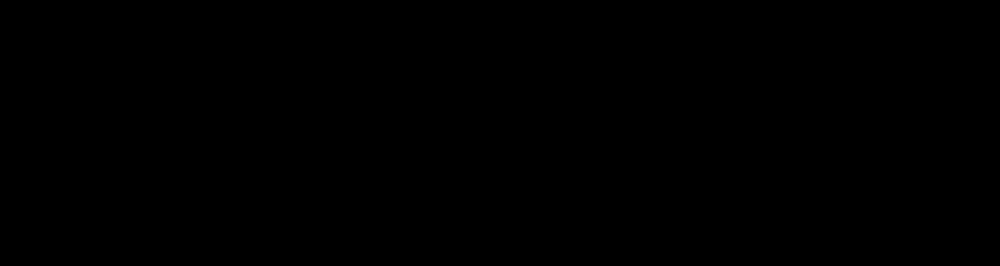
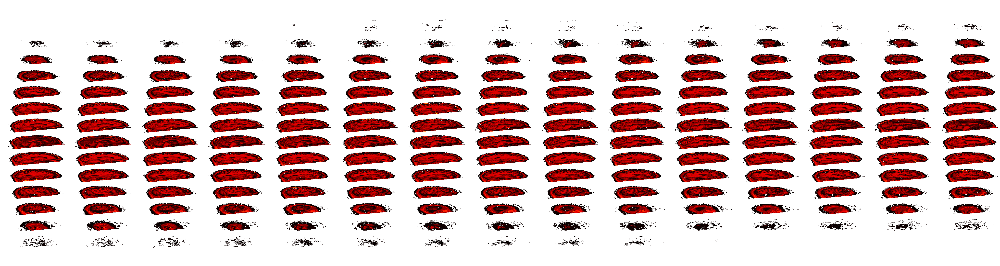

In [6]:
orig = nib.load("C:\\Users\StarDust\\Desktop\\test_imgs\\T1.nii")
view_img(orig, None)
#print('another')



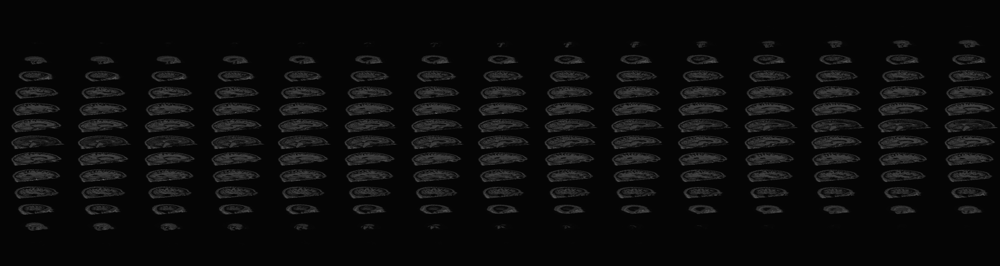
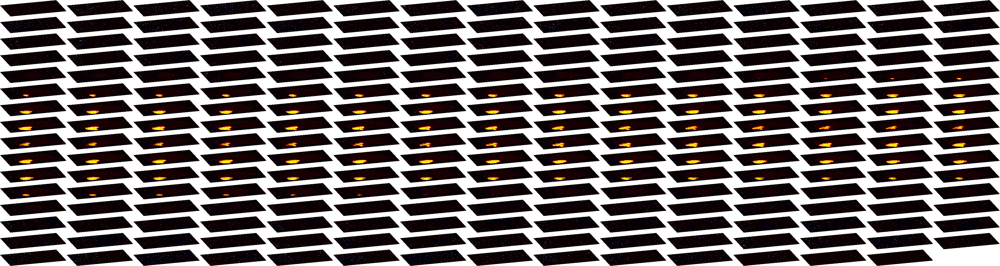

In [7]:
view_img(nifti_cer, orig)


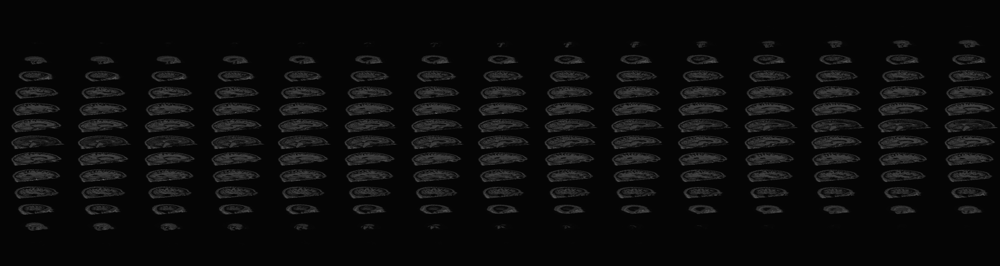
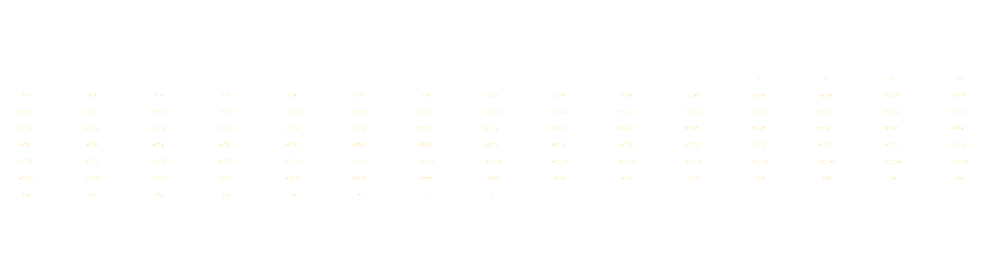

In [10]:
import numpy as np
#np.set_printoptions(precision=3, suppress=True)
cer2 = np.array(cer>0.2).astype(np.uint8)
nifti_cer2 = nib.Nifti1Image(cer2, affine)
view_img(nifti_cer2, orig)

# Model testing

In [11]:
from keras.models import load_model
from utils import *
model = load_model('weights/unet_3d_inception/label7/best.h5', custom_objects={'dice_coefficient': dice_coefficient, 'dice_loss': dice_loss})

## Layers

In [12]:
print(len(model.layers))

74


In [13]:
print(model.input)

Tensor("input_1_1:0", shape=(?, 1, 240, 240, 48), dtype=float32)


In [14]:
from keras import models
activation_model = models.Model(inputs=model.input, outputs=[layer.output for layer in model.layers[1:]])

In [15]:
t1_path = "C:\\Users\StarDust\\Desktop\\test_imgs\\T1.nii"

In [16]:
_input = histeq(to_uint8(get_data_with_skull_scraping(t1_path)))[None, None, ...]

In [17]:
activations = activation_model.predict(_input) 

In [18]:
layer_names = [layer.name for layer in model.layers[1:]]

In [19]:
print(layer_names)

['conv3d_1', 'max_pooling3d_1', 'conv3d_2', 'conv3d_3', 'conv3d_4', 'concatenate_1', 'max_pooling3d_2', 'conv3d_5', 'max_pooling3d_3', 'conv3d_6', 'conv3d_7', 'conv3d_8', 'concatenate_2', 'max_pooling3d_4', 'conv3d_9', 'max_pooling3d_5', 'conv3d_10', 'conv3d_11', 'conv3d_12', 'concatenate_3', 'max_pooling3d_6', 'conv3d_13', 'max_pooling3d_7', 'conv3d_14', 'conv3d_15', 'conv3d_16', 'concatenate_4', 'max_pooling3d_8', 'conv3d_17', 'max_pooling3d_9', 'conv3d_18', 'conv3d_19', 'conv3d_20', 'concatenate_5', 'conv3d_21', 'max_pooling3d_10', 'conv3d_22', 'conv3d_23', 'conv3d_24', 'concatenate_6', 'conv3d_transpose_1', 'concatenate_7', 'conv3d_25', 'max_pooling3d_11', 'conv3d_26', 'conv3d_27', 'conv3d_28', 'concatenate_8', 'conv3d_transpose_2', 'concatenate_9', 'conv3d_29', 'max_pooling3d_12', 'conv3d_30', 'conv3d_31', 'conv3d_32', 'concatenate_10', 'conv3d_transpose_3', 'concatenate_11', 'conv3d_33', 'max_pooling3d_13', 'conv3d_34', 'conv3d_35', 'conv3d_36', 'concatenate_12', 'conv3d_transpos

C:\Users\StarDust\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


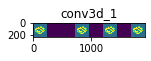

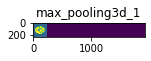

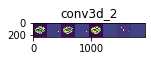

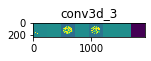

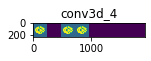

...

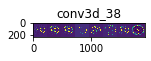

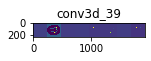

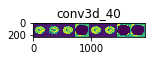

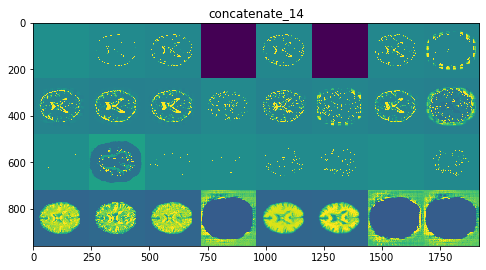

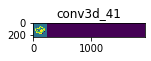

In [89]:
images_per_row = 8

for i, l in enumerate(layer_names):
    #print(i, l, activations[i].shape)
    
    s = activations[i].shape
    
    for j in range(s[0]):
        imgs = []
        shp = activations[i][j][0].shape
        cntr = (shp[0]//2, shp[1]//2, shp[2]//2)
        size = shp[0]
        n_features = s[1]
        n_rows = max(n_features // images_per_row, 1)
        display_grid = np.zeros((size * n_rows, images_per_row * size))
        

        for k in range(s[1]): 
            #imgs.append(activations[i, j, k, :,:,cntr[2]])
            channel_image = activations[i][j][k][:,:,cntr[2]]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            row = k // images_per_row
            col = k % images_per_row
            
            display_grid[row * size : (row + 1) * size, # Displays the grid
                         col * size : (col + 1) * size] = channel_image
        
    
        scale = 2. / size
        plt.figure(figsize=(scale * display_grid.shape[0],
                            scale * display_grid.shape[1]))
        plt.title(l)
        plt.grid(False)
        plt.imshow(display_grid, aspect='1', cmap='viridis')
        
        
            
        
#img = nib.Nifti1Image(activations[i][j][k], affine)
#nib.save(img, "{0}{1}_{2}_{3}_{4}.nii".format(output_dir, i, j, k, l))

In [138]:
_inc_lyr_1 = nib.concat_images([activations[5][0][i] for i in range(len(activations[5][0]))])

ValueError: stat: embedded null character in path

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



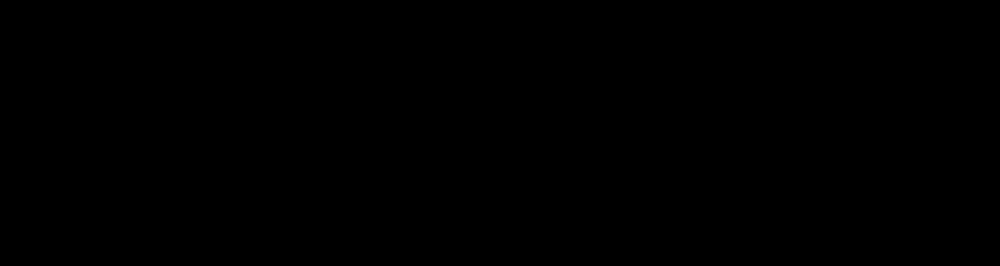
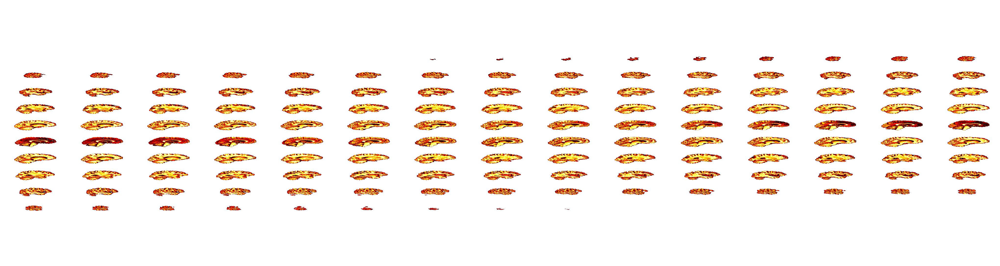

In [129]:
_inc_lyr_1 = nib.Nifti1Image(activations[5][0][0], affine)
view_img(_inc_lyr_1, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



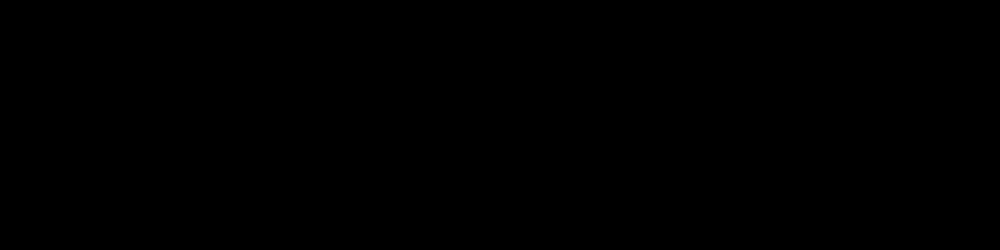
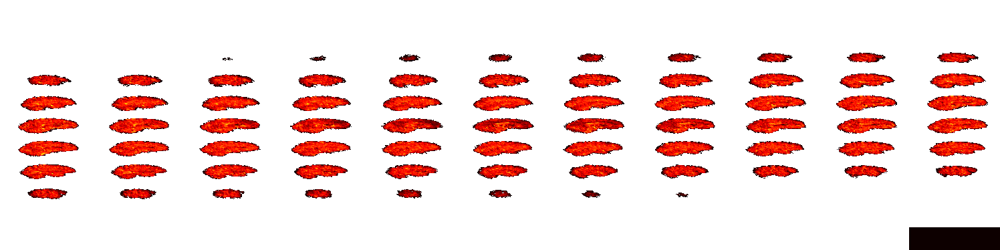

In [130]:
_inc_lyr_2 = nib.Nifti1Image(activations[12][0][0], affine)
view_img(_inc_lyr_2, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



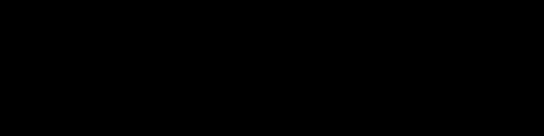
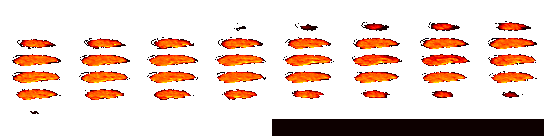

In [132]:
_inc_lyr_3 = nib.Nifti1Image(activations[19][0][0], affine)
view_img(_inc_lyr_3, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



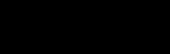
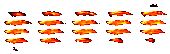

In [133]:
_inc_lyr_4 = nib.Nifti1Image(activations[26][0][0], affine)
view_img(_inc_lyr_4, None)

In [34]:
_inc_lyr_5 = nib.Nifti1Image(activations[33][0][2], affine)
view_img(_inc_lyr_5, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))


C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\plotting\html_stat_map.py:83: UserWarning: Threshold given was 1e-06, but the data has no values below -237.74667358398438. 
  data.min()))
C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



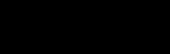
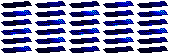

In [38]:
_inc_lyr_6 = nib.Nifti1Image(activations[40][0][0], affine)
view_img(_inc_lyr_6, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



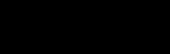
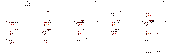

In [41]:
_inc_lyr_6 = nib.Nifti1Image(activations[47][0][2], affine)
view_img(_inc_lyr_6, None)

C:\Users\StarDust\Anaconda3\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



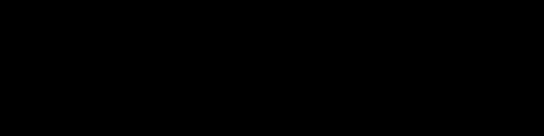
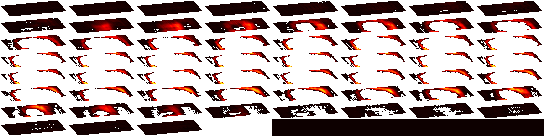

In [45]:
_inc_lyr_7 = nib.Nifti1Image(activations[54][0][3], affine)
view_img(_inc_lyr_7, None)